In [1]:
# Load libraries

# Plotting utils 
import matplotlib.pyplot as plt 
import matplotlib.colors as colors
import matplotlib.ticker as ticker 
import matplotlib.patches as patches
import cartopy
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import cartopy.util

# Analysis
import numpy
#import geocat.comp
import os
import numpy as np 
import xarray as xr
import datetime
from datetime import date, timedelta
import pandas as pd 
import pickle
import Ngl 


## Read in data

In [2]:
## Read in summary files that were computed on Casper (code commented out below)

dataDir = '~/Documents/Analysis/CLUBB_initial/data/'

cesm2_25thAnn = xr.open_dataset(dataDir+'CLUBBds_conditionedOnW500_25thPct_annual.nc')
cesm2_75thAnn = xr.open_dataset(dataDir+'CLUBBds_conditionedOnW500_75thPct_annual.nc')

cesm2_25thJJA = xr.open_dataset(dataDir+'CLUBBds_conditionedOnW500_25thPct_JJA.nc')
cesm2_75thJJA = xr.open_dataset(dataDir+'CLUBBds_conditionedOnW500_75thPct_JJA.nc')

cesm2_25thDJF = xr.open_dataset(dataDir+'CLUBBds_conditionedOnW500_25thPct_DJF.nc')
cesm2_75thDJF = xr.open_dataset(dataDir+'CLUBBds_conditionedOnW500_75thPct_DJF.nc')
                                


In [3]:
#dataDir   = '/Users/mdfowler/Documents/Analysis/CLUBB_initial/data/'
#dataDir = '/glade/work/mdfowler/data/CLUBB_sim/'
filestart = 'f.e20.FHIST.f09_f09.cesm2_1.001.cam.h0.'

decades  = np.asarray(['1990-99_','2000-14_'])
#varfiles = np.asarray(['PBLH.nc','CLUBBwinds.nc','sfcFluxes.nc','extraCLUBBvars.nc','CloudVarsEtc.nc'])


In [4]:
# Read in example file to get some constant fields
testName = dataDir+filestart+'1990-01.nc'
testDF   = xr.open_dataset(testName)

lon = testDF.lon.values
lat = testDF.lat.values



In [5]:
## Function from Brian Medeiros to convert times to middle of period 
#  rather than the end of the averaging period. 

def cesm_correct_time(ds):
    """Given a Dataset, check for time_bnds,
       and use avg(time_bnds) to replace the time coordinate.
       Purpose is to center the timestamp on the averaging inverval.   
       NOTE: ds should have been loaded using `decode_times=False`
    """
    assert 'time_bnds' in ds
    assert 'time' in ds
    correct_time_values = ds['time_bnds'].mean(dim='nbnd')
    # copy any metadata:
    correct_time_values.attrs = ds['time'].attrs
    ds = ds.assign_coords({"time": correct_time_values})
    ds = xr.decode_cf(ds)  # decode to datetime objects
    return ds

In [6]:
# Read in data by decade 

for iDec in range(len(decades)): 
#     pblhFile = dataDir+filestart+decades[iDec]+'PBLH.nc'
#     pblhDS   = xr.open_dataset(pblhFile, decode_times=False)
#     pblhDS   = cesm_correct_time(pblhDS)
    
    fluxFile = dataDir+filestart+decades[iDec]+'sfcFluxes.nc'
    fluxDS   = xr.open_dataset(fluxFile, decode_times=False)
    fluxDS   = cesm_correct_time(fluxDS)
    
#     clubbFile = dataDir+filestart+decades[iDec]+'extraCLUBBvars.nc'
#     clubbDS   = xr.open_dataset(clubbFile, decode_times=False)
#     clubbDS   = cesm_correct_time(clubbDS)
    
#     cloudFile = dataDir+filestart+decades[iDec]+'CloudVarsEtc.nc'
#     cloudDS   = xr.open_dataset(cloudFile, decode_times=False)
#     cloudDS   = cesm_correct_time(cloudDS)
    
#     windFile  = dataDir+filestart+decades[iDec]+'CLUBBwinds.nc'
#     windDS   = xr.open_dataset(windFile, decode_times=False)
#     windDS   = cesm_correct_time(windDS)
    
    if iDec==0: 
#         fullPBLH  = pblhDS
        fullFlux  = fluxDS
#         fullCLUBB = clubbDS
#         fullCloud = cloudDS
#         fullWind  = windDS 
    else: 
#         fullPBLH  = xr.concat([fullPBLH,  pblhDS],   dim="time")
        fullFlux  = xr.concat([fullFlux,  fluxDS],   dim="time")
#         fullCLUBB = xr.concat([fullCLUBB, clubbDS],  dim="time")
#         fullCloud = xr.concat([fullCloud, cloudDS],  dim="time")
#         fullWind  = xr.concat([fullWind,  windDS],   dim="time")
        

    print('Done with decade: ', decades[iDec])
    

Done with decade:  1990-99_
Done with decade:  2000-14_


In [10]:
# Get dates 
dates = fullFlux.indexes['time'].to_datetimeindex()
# To be able to easily access years, months, days - use Pandas 
dates = pd.DatetimeIndex(dates)

<ipython-input-10-216434e1c5bc>:2: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dates = fullFlux.indexes['time'].to_datetimeindex()


### Read in ERA5 data as well

In [7]:
era5dir = '/Users/mdfowler/Documents/Analysis/CLUBB_initial/data/obs/ERA5/'

# era5_w500file = era5dir+'ERA5_W500-1990-2014.nc'
# era5_fluxFile = era5dir+'ERA5_sfcFluxes-1990-2014.nc'

# era5_w500 = xr.open_dataset(era5_w500file, decode_times=True)

# era5_flux = xr.open_dataset(era5_fluxFile, decode_times=True)


## Use files that have already been regridded to model resolution using NCL linint2
#  --------------------------------------------------------------------------------
era5_w500file = era5dir+'Regrid_ERA5_W500-1990-2014.nc'
era5_fluxFile = era5dir+'Regrid_ERA5_sfcFluxes-1990-2014.nc'

era5_w500 = xr.open_dataset(era5_w500file, decode_times=True)
era5_flux = xr.open_dataset(era5_fluxFile, decode_times=True)


In [14]:
## Fix flux to be negative downwards 
era5_flux['SHobs'] = -era5_flux['SHobs']
era5_flux['LHobs'] = -era5_flux['LHobs']


In [8]:
# Get ERA5 dates 
era5_dates = pd.DatetimeIndex(era5_w500['time'].values)


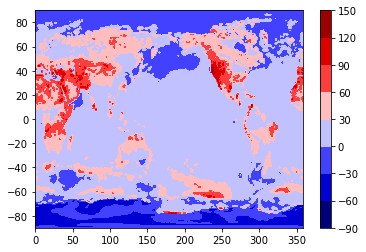

In [16]:
plt.contourf(era5_flux.lon.values,era5_flux.lat.values,era5_flux['SHobs'].values[6,:,:],cmap='seismic')
plt.colorbar()

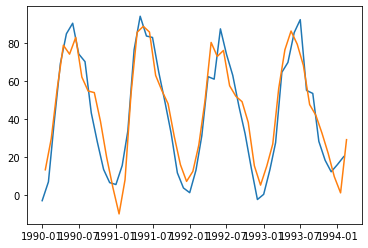

In [15]:
plt.plot(era5_dates[0:50], era5_flux['SHobs'].values[0:50,135,200])
plt.plot(dates[0:50], fullFlux['SHFLX'].values[0:50,135,200])

### Get 500mb vertical velocity

Modifying to use omega (Pa/s) rather than actual vertical velocity in m/s.

In [17]:
# Read in data by decade 

for iDec in range(len(decades)): 
    
    windFile = dataDir+filestart+decades[iDec]+'OMEGA.nc'
    wDS   = xr.open_dataset(windFile, decode_times=True)
    #wDS   = cesm_correct_time(wDS)
    
    psFile   = dataDir+filestart+decades[iDec]+'PS.nc'
    psDS     = xr.open_dataset(psFile, decode_times=False)
    psDS     = cesm_correct_time(psDS)
    
    if iDec==0: 
        fullW  = wDS
        fullPS = psDS
    else: 
        fullW  = xr.concat([fullW,  wDS],   dim="time")
        fullPS = xr.concat([fullPS, psDS],     dim="time")

    print('Done with decade: ', decades[iDec])
    

Done with decade:  1990-99_
Done with decade:  2000-14_


In [18]:
# New pressure levels in hPa 
pnew = np.arange(500.0,1000.0,50.0) 

# Surface pressure with time dimension
PS   = fullPS.PS.values              # Pa

p0mb = testDF.P0.values/100       # mb
# Pull out hya/hyb profiles 
hyam = testDF.hyam.values
hybm = testDF.hybm.values
hyai = testDF.hyai.values
hybi = testDF.hybi.values

# Converting HTG variables: 
W  = Ngl.vinth2p(fullW.OMEGA.values, hyai, hybi, pnew, PS, 1, p0mb, 1, True)
#W  = gc.vinth2p(fullW.W.values, hyai, hybi, pnew, PS, 1, p0mb, 1, True)


In [19]:
# 500 mb vertical velocity: 
W500 = np.squeeze(W[:,0,:,:])

lon = fullW.lon.values
lat = fullW.lat.values
# lev = fullCLUBB.lev.values
# ilev = fullCLUBB.ilev.values


In [44]:
# # Get dates 
# dates = fullW.indexes['time'].to_datetimeindex()
# # To be able to easily access years, months, days - use Pandas 
# dates = pd.DatetimeIndex(dates)

# # # # ERA5 dates 
# # # era5_dates = pd.DatetimeIndex(era5_w500['time'].values)

<ipython-input-44-55fdc56c083e>:2: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dates = fullW.indexes['time'].to_datetimeindex()


In [20]:
# Try to save some memory 
del fullW 
del W 
del fullPS 


### Get indices for DJF and JJA as well

In [21]:
iJJA = np.where((dates.month>=6) & (dates.month<=8))[0]
iDJF = np.where((dates.month==12) | (dates.month<=2))[0]

iJJA_era5 = np.where((era5_dates.month>=6) & (era5_dates.month<=8))[0]
iDJF_era5 = np.where((era5_dates.month==12) | (era5_dates.month<=2))[0]


In [22]:
# # Create DS's for just those seasons too: 
# #   Useful later on for averaging 

fullFlux_DJF = fullFlux.isel(time=iDJF)
fullFlux_JJA = fullFlux.isel(time=iJJA)

# fullPBLH_DJF = fullPBLH.isel(time=iDJF)
# fullPBLH_JJA = fullPBLH.isel(time=iJJA)

# fullCLUBB_DJF = fullCLUBB.isel(time=iDJF)
# fullCLUBB_JJA = fullCLUBB.isel(time=iJJA)

# fullWind_DJF  = fullWind.isel(time=iDJF)
# fullWind_JJA  = fullWind.isel(time=iJJA)

# era5_w500_DJF = era5_w500.isel(time=iDJF_era5)
# era5_w500_JJA = era5_w500.isel(time=iJJA_era5)

era5_flux_DJF = era5_flux.isel(time=iDJF_era5)
era5_flux_JJA = era5_flux.isel(time=iJJA_era5)



## Define some compositing schemes: 
* Based on 500 mb veritcal velocity
* Based on rain amount 
* Based on cloud amount 


Text(0.5, 1.0, 'ERA5 Mean 500mb Vertical Velocity [JJA]')

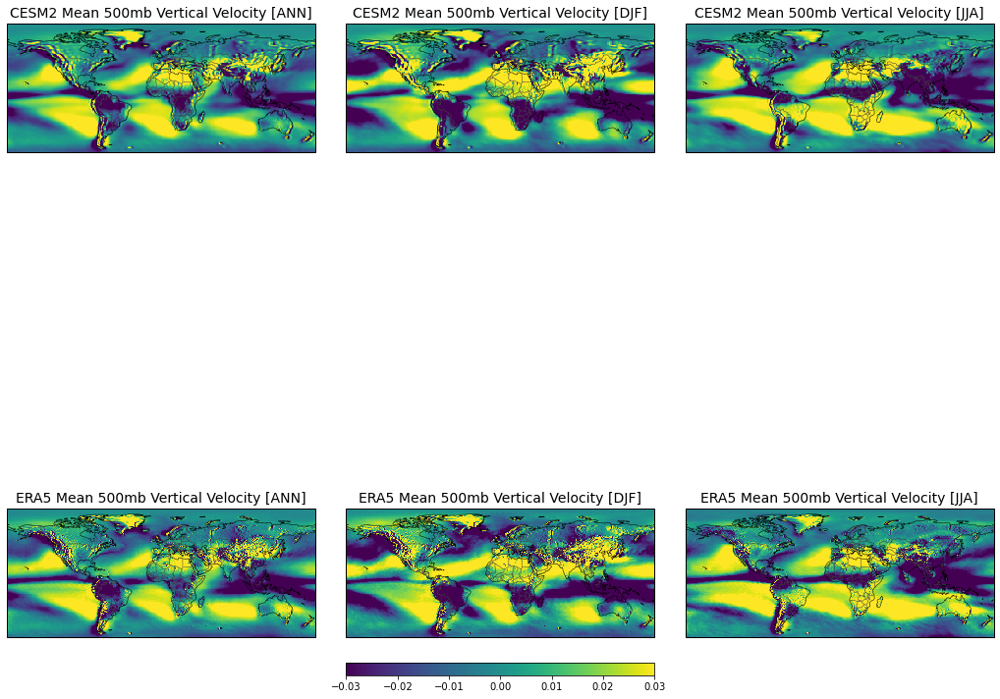

In [19]:
# # --------------------------------------------------
# # Question 1: What does 500 hPa velocity look like??
# # --------------------------------------------------

# # Set up figure 
# # -------------
# fig, axs = plt.subplots(2,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree()})
# #Put axs handles in array, axs 
# axs = axs.ravel()
# #Adjust space between subplots 
# fig.subplots_adjust(hspace = 0.02,wspace = 0.1)
# # Set limits of plot
# axs[0].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
# axs[1].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
# axs[2].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
# axs[3].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
# axs[4].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
# axs[5].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
# # Add coastlines 
# axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
# axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
# axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
# axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
# axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
# axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
# # Add country borders 
# axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
# axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
# axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
# axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
# axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
# axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# # Now plot some means... 
# # ---------------------

# contour_plot0 = axs[0].pcolor(lon,lat,np.squeeze(np.nanmean(W500,axis=0)),shading='auto',
#                               vmax=0.03,vmin=-0.03)
# contour_plot1 = axs[1].pcolor(lon,lat,np.squeeze(np.nanmean(W500[iDJF,:,:],axis=0)),shading='auto',
#                               vmax=0.03,vmin=-0.03)
# contour_plot2 = axs[2].pcolor(lon,lat,np.squeeze(np.nanmean(W500[iJJA,:,:],axis=0)),shading='auto',
#                               vmax=0.03,vmin=-0.03)

# axs[0].set_title('CESM2 Mean 500mb Vertical Velocity [ANN]',fontsize=14)
# axs[1].set_title('CESM2 Mean 500mb Vertical Velocity [DJF]',fontsize=14)
# axs[2].set_title('CESM2 Mean 500mb Vertical Velocity [JJA]',fontsize=14)

# # Plot the same for ERA5
# # -----------------------
# contour_plot3 = axs[3].pcolor(lon,lat,np.squeeze(np.nanmean(era5_w500.W500_obs.values,axis=0)),shading='auto',
#                               vmax=0.03,vmin=-0.03)
# contour_plot4 = axs[4].pcolor(lon,lat,np.squeeze(np.nanmean(era5_w500.W500_obs.values[iDJF_era5,:,:],axis=0)),shading='auto',
#                               vmax=0.03,vmin=-0.03)
# contour_plot5 = axs[5].pcolor(lon,lat,np.squeeze(np.nanmean(era5_w500.W500_obs.values[iJJA_era5,:,:],axis=0)),shading='auto',
#                               vmax=0.03,vmin=-0.03)

# ax_position = axs[4].get_position()
# cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
# cbar        = plt.colorbar(contour_plot4, orientation='horizontal', cax=cbar_ax)


# axs[3].set_title('ERA5 Mean 500mb Vertical Velocity [ANN]',fontsize=14)
# axs[4].set_title('ERA5 Mean 500mb Vertical Velocity [DJF]',fontsize=14)
# axs[5].set_title('ERA5 Mean 500mb Vertical Velocity [JJA]',fontsize=14)



In [36]:
# # # Bin by quartile per location? 
# W500_25pct = np.percentile(W500,25,axis=0)   # Bottom quartile value by location
# W500_75pct = np.percentile(W500,75,axis=0)   # Upper quartile value by location 

# # Also define seasonally? 
# W500_25pct_DJF    = np.percentile(W500[iDJF,:,:],25,axis=0)   # Bottom quartile value by location
# W500_75pct_DJF    = np.percentile(W500[iDJF,:,:],75,axis=0)   # Upper quartile value by location 
# W500_25pct_JJA    = np.percentile(W500[iJJA,:,:],25,axis=0)   # Bottom quartile value by location
# W500_75pct_JJA    = np.percentile(W500[iJJA,:,:],75,axis=0)   # Upper quartile value by location 


In [19]:
# # Also bin by location for ERA5 reanalysis
# W500_25pct_era5 = np.percentile(era5_w500.W500_obs.values,25,axis=0)
# W500_75pct_era5 = np.percentile(era5_w500.W500_obs.values,75,axis=0)

# # Also define seasonally? 
# W500_25pct_eraDJF = np.percentile(era5_w500.W500_obs.values[iDJF_era5,:,:],25,axis=0)   # Bottom quartile value by location
# W500_75pct_eraDJF = np.percentile(era5_w500.W500_obs.values[iDJF_era5,:,:],75,axis=0)   # Upper quartile value by location 
# W500_25pct_eraJJA = np.percentile(era5_w500.W500_obs.values[iJJA_era5,:,:],25,axis=0)   # Bottom quartile value by location
# W500_75pct_eraJJA = np.percentile(era5_w500.W500_obs.values[iJJA_era5,:,:],75,axis=0)   # Upper quartile value by location 



**There must be a way to do this more efficiently** <br>
It would be more helpful to have some kind of function that can be called repeatedly to compute these things...

In [14]:
# ## Combine everything into single DS: 

# dsAll         = fullFlux 
# dsAll['W500'] = (('time','lat','lon'), W500)
# dsAll['PBLH'] = (('time','lat','lon'), fullPBLH.PBLH)

# #dsAll         = xr.merge([fullCLUBB, fullWind, dsAll])
# dsAll         = xr.merge([fullCLUBB, dsAll])



In [15]:
# del fullCLUBB
# #del fullWind 
# del fullFlux 
# del fullPBLH 


In [45]:
## Combine everything into single DS (ERA5): 
dsAll_era5             = era5_flux 
dsAll_era5['W500_obs'] = (('time','lat','lon'), era5_w500.W500_obs)


In [46]:
'''
Inputs: 
   sepVar:  Name of variable upon which to define percentiles (separations). In this case for example, W500.
             Assumed to be part of the DS that gets passed in (varDS)
   pctLow:  Percentile to use for defining the bottom values (i.e., 25) [int]
   pctHigh: Percentile to use for defining the top values (i.e., 75)    [int]
   time:    Pandas datetimeindex to use for getting seasons             [time]
   varDS:   Xarray datset containing variables of interest 
'''

def getMeansInPercentiles(varDS,sepVarStr,pctLow,pctHigh,time):
    
    ## 1: Get indices of seasons 
    iJJA = np.where((time.month>=6) & (time.month<=8))[0]
    iDJF = np.where((time.month==12) | (time.month<=2))[0]
    
    var_JJA = varDS.isel(time=iJJA)
    var_DJF = varDS.isel(time=iDJF)
    
    ## 2: Get percentiles of classification variables annually and by seasons
    print('Getting percentiles annually and seasonally...')
    sepVar_lowAnnual  = np.percentile(varDS[sepVarStr].values, pctLow,  axis=0)
    sepVar_highAnnual = np.percentile(varDS[sepVarStr].values, pctHigh, axis=0)
    
    sepVar_lowJJA     = np.percentile(var_JJA[sepVarStr].values, pctLow,   axis=0)
    sepVar_highJJA    = np.percentile(var_JJA[sepVarStr].values, pctHigh,  axis=0)
    
    sepVar_lowDJF     = np.percentile(var_DJF[sepVarStr].values, pctLow,   axis=0)
    sepVar_highDJF    = np.percentile(var_DJF[sepVarStr].values, pctHigh,  axis=0)
    
    ## 3: Get mean values of varibles (var) within those classifications
    
    print('Computing means over annual timescales...')
    dsLow_annual  = varDS.where( varDS[sepVarStr] <= sepVar_lowAnnual,  drop=True ).mean(dim='time')
    dsHigh_annual = varDS.where( varDS[sepVarStr] >= sepVar_highAnnual, drop=True ).mean(dim='time')
    
    print('Computing means for JJA...')
    dsLow_JJA     = varDS.where( var_JJA[sepVarStr] <= sepVar_lowJJA,  drop=True ).mean(dim='time')
    dsHigh_JJA    = varDS.where( var_JJA[sepVarStr] >= sepVar_highJJA, drop=True ).mean(dim='time')
    
    print('Computing means for DJF...')
    dsLow_DJF     = varDS.where( var_DJF[sepVarStr] <= sepVar_lowDJF,  drop=True ).mean(dim='time')
    dsHigh_DJF    = varDS.where( var_DJF[sepVarStr] >= sepVar_highDJF, drop=True ).mean(dim='time')
    
    print('Complete!')
    return dsLow_annual,dsHigh_annual,dsLow_JJA,dsHigh_JJA,dsLow_DJF,dsHigh_DJF


In [17]:
# dsLow_annual,dsHigh_annual,dsLow_JJA,dsHigh_JJA,dsLow_DJF,dsHigh_DJF = getMeansInPercentiles(dsAll,'W500',25,75,dates)


Getting percentiles annually and seasonally...
Computing means over annual timescales...
Computing means for JJA...
Computing means for DJF...
Complete!


In [47]:
era5_25thAnn,era5_75thAnn,era5_25thJJA,era5_75thJJA,era5_25thDJF,era5_75thDJF = getMeansInPercentiles(dsAll_era5,'W500_obs',25,75,era5_dates)



Getting percentiles annually and seasonally...
Computing means over annual timescales...
Computing means for JJA...
Computing means for DJF...
Complete!


In [20]:
# # Save out to netCDF files 
# fileName_25ann = 'CLUBBds_conditionedOnW500_25thPct_annual.nc'
# dsLow_annual.to_netcdf(path=dataDir+fileName_25ann)

# fileName_75ann = 'CLUBBds_conditionedOnW500_75thPct_annual.nc'
# dsHigh_annual.to_netcdf(path=dataDir+fileName_75ann)


# fileName_25djf = 'CLUBBds_conditionedOnW500_25thPct_DJF.nc'
# dsLow_DJF.to_netcdf(path=dataDir+fileName_25djf)

# fileName_75djf = 'CLUBBds_conditionedOnW500_75thPct_DJF.nc'
# dsHigh_DJF.to_netcdf(path=dataDir+fileName_75djf)


# fileName_25jja = 'CLUBBds_conditionedOnW500_25thPct_JJA.nc'
# dsLow_JJA.to_netcdf(path=dataDir+fileName_25jja)

# fileName_75jja = 'CLUBBds_conditionedOnW500_75thPct_JJA.nc'
# dsHigh_JJA.to_netcdf(path=dataDir+fileName_75jja)


Text(0.5, 1.0, 'ERA5 Mean 500mb Vertical Velocity \n<=25th% [JJA]')

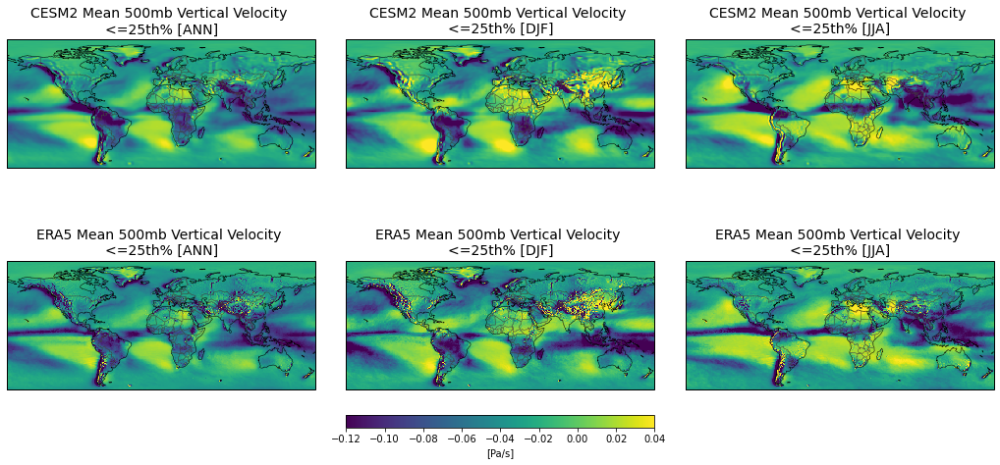

In [21]:
# # --------------------------------------------------
# # Question 2: What do percentiles look like for ERA5 vs CESM2??
# # --------------------------------------------------

# # Set up figure 
# # -------------
fig, axs = plt.subplots(2,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree()})
#Put axs handles in array, axs 
axs = axs.ravel()
#Adjust space between subplots 
fig.subplots_adjust(hspace = -0.7,wspace = 0.1)
# Set limits of plot
axs[0].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[1].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[2].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[3].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[4].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[5].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
# Add coastlines 
axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
# Add country borders 
axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
# Color limits
cmax = 0.04
cmin = -0.12

# Now plot some means... 
# ---------------------

contour_plot0 = axs[0].pcolor(lon,lat,np.squeeze(cesm2_25thAnn['W500'].values),shading='auto',
                              vmax=cmax,vmin=cmin)
contour_plot1 = axs[1].pcolor(lon,lat,np.squeeze(cesm2_25thDJF['W500'].values),shading='auto',
                              vmax=cmax,vmin=cmin)
contour_plot2 = axs[2].pcolor(lon,lat,np.squeeze(cesm2_25thJJA['W500'].values),shading='auto',
                              vmax=cmax,vmin=cmin)

axs[0].set_title('CESM2 Mean 500mb Vertical Velocity \n<=25th% [ANN]',fontsize=14)
axs[1].set_title('CESM2 Mean 500mb Vertical Velocity \n<=25th% [DJF]',fontsize=14)
axs[2].set_title('CESM2 Mean 500mb Vertical Velocity \n<=25th% [JJA]',fontsize=14)

# Plot the same for ERA5
# -----------------------
contour_plot3 = axs[3].pcolor(lon,lat,np.squeeze(era5_25thAnn.W500_obs.values),shading='auto',
                              vmax=cmax,vmin=cmin)
contour_plot4 = axs[4].pcolor(lon,lat,np.squeeze(era5_25thDJF.W500_obs.values),shading='auto',
                              vmax=cmax,vmin=cmin)
contour_plot5 = axs[5].pcolor(lon,lat,np.squeeze(era5_25thJJA.W500_obs.values),shading='auto',
                              vmax=cmax,vmin=cmin)

ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot4, orientation='horizontal', cax=cbar_ax,label='[Pa/s]')


axs[3].set_title('ERA5 Mean 500mb Vertical Velocity \n<=25th% [ANN]',fontsize=14)
axs[4].set_title('ERA5 Mean 500mb Vertical Velocity \n<=25th% [DJF]',fontsize=14)
axs[5].set_title('ERA5 Mean 500mb Vertical Velocity \n<=25th% [JJA]',fontsize=14)


Text(0.5, 1.0, 'ERA5 Mean 500mb Vertical Velocity \n<=75th% [JJA]')

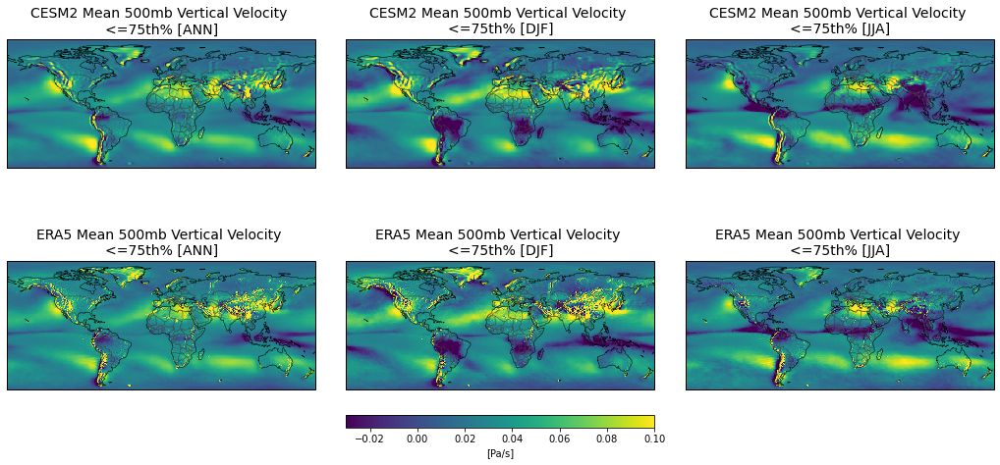

In [23]:
# # --------------------------------------------------
# # Question 2: What do percentiles look like for ERA5 vs CESM2??
# # --------------------------------------------------

# # Set up figure 
# # -------------
fig, axs = plt.subplots(2,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree()})
#Put axs handles in array, axs 
axs = axs.ravel()
#Adjust space between subplots 
fig.subplots_adjust(hspace = -0.7,wspace = 0.1)
# Set limits of plot
axs[0].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[1].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[2].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[3].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[4].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[5].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
# Add coastlines 
axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
# Add country borders 
axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
# Color limits
cmax = 0.10
cmin = -0.03

# Now plot some means... 
# ---------------------

contour_plot0 = axs[0].pcolor(lon,lat,np.squeeze(cesm2_75thAnn['W500'].values),shading='auto',
                              vmax=cmax,vmin=cmin)
contour_plot1 = axs[1].pcolor(lon,lat,np.squeeze(cesm2_75thDJF['W500'].values),shading='auto',
                              vmax=cmax,vmin=cmin)
contour_plot2 = axs[2].pcolor(lon,lat,np.squeeze(cesm2_75thJJA['W500'].values),shading='auto',
                              vmax=cmax,vmin=cmin)

axs[0].set_title('CESM2 Mean 500mb Vertical Velocity \n<=75th% [ANN]',fontsize=14)
axs[1].set_title('CESM2 Mean 500mb Vertical Velocity \n<=75th% [DJF]',fontsize=14)
axs[2].set_title('CESM2 Mean 500mb Vertical Velocity \n<=75th% [JJA]',fontsize=14)

# Plot the same for ERA5
# -----------------------
contour_plot3 = axs[3].pcolor(lon,lat,np.squeeze(era5_75thAnn.W500_obs.values),shading='auto',
                              vmax=cmax,vmin=cmin)
contour_plot4 = axs[4].pcolor(lon,lat,np.squeeze(era5_75thDJF.W500_obs.values),shading='auto',
                              vmax=cmax,vmin=cmin)
contour_plot5 = axs[5].pcolor(lon,lat,np.squeeze(era5_75thJJA.W500_obs.values),shading='auto',
                              vmax=cmax,vmin=cmin)

ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot4, orientation='horizontal', cax=cbar_ax,label='[Pa/s]')


axs[3].set_title('ERA5 Mean 500mb Vertical Velocity \n<=75th% [ANN]',fontsize=14)
axs[4].set_title('ERA5 Mean 500mb Vertical Velocity \n<=75th% [DJF]',fontsize=14)
axs[5].set_title('ERA5 Mean 500mb Vertical Velocity \n<=75th% [JJA]',fontsize=14)



## Step 1: what do model biases look like for each category? 

Text(0.5, 1.0, 'SHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct - w500<=25thPct | JJA]')

/Users/mdfowler/opt/anaconda3/envs/pyn_env/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:387: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  return matplotlib.axes.Axes.draw(self, renderer=renderer,


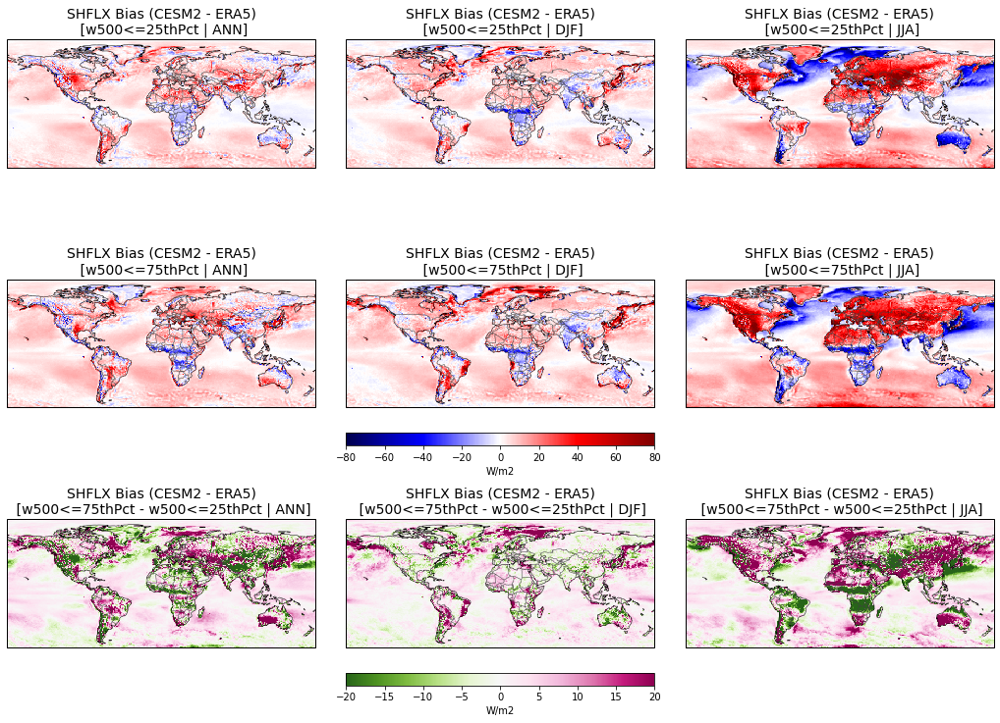

In [48]:
# Set up figure 
# -------------
fig, axs = plt.subplots(3,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree()})
#Put axs handles in array, axs 
axs = axs.ravel()
#Adjust space between subplots 
fig.subplots_adjust(hspace = -0.5,wspace = 0.1)
# Set limits of plot
axs[0].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[1].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[2].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[3].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[4].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[5].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[6].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[7].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[8].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
# Add coastlines 
axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
axs[6].coastlines(linewidth=0.5,edgecolor='0.25')
axs[7].coastlines(linewidth=0.5,edgecolor='0.25')
axs[8].coastlines(linewidth=0.5,edgecolor='0.25')
# Add country borders 
axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[6].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[7].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[8].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# Now plot some means... 
# ---------------------

cmax = 80
cmin = -cmax

contour_plot0 = axs[0].pcolor(lon,lat,np.squeeze(cesm2_25thAnn.SHFLX.values - era5_25thAnn.SHobs.values),
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot1 = axs[1].pcolor(lon,lat,np.squeeze(cesm2_25thDJF.SHFLX.values - era5_25thDJF.SHobs.values),
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot2 = axs[2].pcolor(lon,lat,np.squeeze(cesm2_25thJJA.SHFLX.values - era5_25thAnn.SHobs.values),
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')


axs[0].set_title('SHFLX Bias (CESM2 - ERA5)\n [w500<=25thPct | ANN]',fontsize=14)
axs[1].set_title('SHFLX Bias (CESM2 - ERA5)\n [w500<=25thPct | DJF]',fontsize=14)
axs[2].set_title('SHFLX Bias (CESM2 - ERA5)\n [w500<=25thPct | JJA]',fontsize=14)

# Plot the same for ERA5
# -----------------------
contour_plot3 = axs[3].pcolor(lon,lat,np.squeeze(cesm2_75thAnn.SHFLX.values - era5_75thAnn.SHobs.values),
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot4 = axs[4].pcolor(lon,lat,np.squeeze(cesm2_75thDJF.SHFLX.values - era5_75thDJF.SHobs.values),
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot5 = axs[5].pcolor(lon,lat,np.squeeze(cesm2_75thJJA.SHFLX.values - era5_75thAnn.SHobs.values),
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')                  

ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot4, orientation='horizontal', cax=cbar_ax, label='W/m2')


axs[3].set_title('SHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct | ANN]',fontsize=14)
axs[4].set_title('SHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct | DJF]',fontsize=14)
axs[5].set_title('SHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct | JJA]',fontsize=14)


# Plot the difference in 75th - 25th percentile biases 
# -----------------------
contour_plot6 = axs[6].pcolor(lon,lat,
                              np.squeeze(cesm2_75thAnn.SHFLX.values - era5_75thAnn.SHobs.values)-np.squeeze(cesm2_25thAnn.SHFLX.values - era5_25thAnn.SHobs.values),
                              cmap='PiYG_r',vmax=20,vmin=-20,shading='auto')

contour_plot7 = axs[7].pcolor(lon,lat,
                              np.squeeze(cesm2_75thDJF.SHFLX.values - era5_75thDJF.SHobs.values)- np.squeeze(cesm2_25thDJF.SHFLX.values - era5_25thDJF.SHobs.values),
                              cmap='PiYG_r',vmax=20,vmin=-20,shading='auto')

contour_plot8 = axs[8].pcolor(lon,lat,
                              np.squeeze(cesm2_75thJJA.SHFLX.values - era5_75thAnn.SHobs.values)-np.squeeze(cesm2_25thJJA.SHFLX.values - era5_25thAnn.SHobs.values),
                              cmap='PiYG_r',vmax=20,vmin=-20,shading='auto')                  

ax_position = axs[7].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot7, orientation='horizontal', cax=cbar_ax, label='W/m2')


axs[6].set_title('SHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct - w500<=25thPct | ANN]',fontsize=14)
axs[7].set_title('SHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct - w500<=25thPct | DJF]',fontsize=14)
axs[8].set_title('SHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct - w500<=25thPct | JJA]',fontsize=14)



Text(0.5, 1.0, 'LHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct - w500<=25thPct | JJA]')

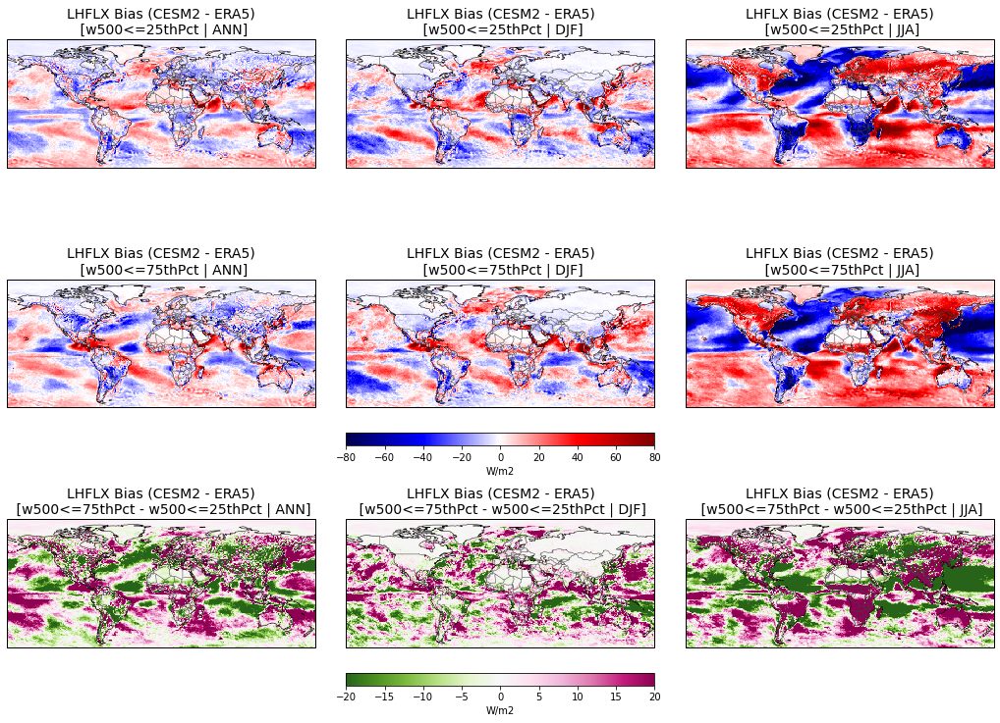

In [49]:
# Set up figure 
# -------------
fig, axs = plt.subplots(3,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree()})
#Put axs handles in array, axs 
axs = axs.ravel()
#Adjust space between subplots 
fig.subplots_adjust(hspace = -0.5,wspace = 0.1)
# Set limits of plot
axs[0].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[1].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[2].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[3].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[4].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[5].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[6].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[7].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[8].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
# Add coastlines 
axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
axs[6].coastlines(linewidth=0.5,edgecolor='0.25')
axs[7].coastlines(linewidth=0.5,edgecolor='0.25')
axs[8].coastlines(linewidth=0.5,edgecolor='0.25')
# Add country borders 
axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[6].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[7].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[8].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# Now plot some means... 
# ---------------------

cmax = 80
cmin = -cmax

contour_plot0 = axs[0].pcolor(lon,lat,np.squeeze(cesm2_25thAnn.LHFLX.values - era5_25thAnn.LHobs.values),
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot1 = axs[1].pcolor(lon,lat,np.squeeze(cesm2_25thDJF.LHFLX.values - era5_25thDJF.LHobs.values),
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot2 = axs[2].pcolor(lon,lat,np.squeeze(cesm2_25thJJA.LHFLX.values - era5_25thAnn.LHobs.values),
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')


axs[0].set_title('LHFLX Bias (CESM2 - ERA5)\n [w500<=25thPct | ANN]',fontsize=14)
axs[1].set_title('LHFLX Bias (CESM2 - ERA5)\n [w500<=25thPct | DJF]',fontsize=14)
axs[2].set_title('LHFLX Bias (CESM2 - ERA5)\n [w500<=25thPct | JJA]',fontsize=14)

# Plot the same for ERA5
# -----------------------
contour_plot3 = axs[3].pcolor(lon,lat,np.squeeze(cesm2_75thAnn.LHFLX.values - era5_75thAnn.LHobs.values),
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot4 = axs[4].pcolor(lon,lat,np.squeeze(cesm2_75thDJF.LHFLX.values - era5_75thDJF.LHobs.values),
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot5 = axs[5].pcolor(lon,lat,np.squeeze(cesm2_75thJJA.LHFLX.values - era5_75thAnn.LHobs.values),
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')                  

ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot4, orientation='horizontal', cax=cbar_ax, label='W/m2')


axs[3].set_title('LHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct | ANN]',fontsize=14)
axs[4].set_title('LHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct | DJF]',fontsize=14)
axs[5].set_title('LHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct | JJA]',fontsize=14)

# Plot the difference in 75th - 25th percentile biases 
# -----------------------
contour_plot6 = axs[6].pcolor(lon,lat,
                              np.squeeze(cesm2_75thAnn.LHFLX.values - era5_75thAnn.LHobs.values)-np.squeeze(cesm2_25thAnn.LHFLX.values - era5_25thAnn.LHobs.values),
                              cmap='PiYG_r',vmax=20,vmin=-20,shading='auto')

contour_plot7 = axs[7].pcolor(lon,lat,
                              np.squeeze(cesm2_75thDJF.LHFLX.values - era5_75thDJF.LHobs.values)- np.squeeze(cesm2_25thDJF.LHFLX.values - era5_25thDJF.LHobs.values),
                              cmap='PiYG_r',vmax=20,vmin=-20,shading='auto')

contour_plot8 = axs[8].pcolor(lon,lat,
                              np.squeeze(cesm2_75thJJA.LHFLX.values - era5_75thAnn.LHobs.values)-np.squeeze(cesm2_25thJJA.LHFLX.values - era5_25thAnn.LHobs.values),
                              cmap='PiYG_r',vmax=20,vmin=-20,shading='auto')                  

ax_position = axs[7].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot7, orientation='horizontal', cax=cbar_ax, label='W/m2')


axs[6].set_title('LHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct - w500<=25thPct | ANN]',fontsize=14)
axs[7].set_title('LHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct - w500<=25thPct | DJF]',fontsize=14)
axs[8].set_title('LHFLX Bias (CESM2 - ERA5)\n [w500<=75thPct - w500<=25thPct | JJA]',fontsize=14)


### Stepping back a little: Does surface flux bias *correlate* with w500??

Maybe use annual/DJF/JJA mean flux biases vs. mean/high/low w500?

In [40]:
SH_v_cesmW500_corrAnn = np.full([len(lat), len(lon)], np.nan)
SH_v_era5W500_corrAnn = np.full([len(lat), len(lon)], np.nan)

SH_v_cesmW500_corrDJF = np.full([len(lat), len(lon)], np.nan)
SH_v_era5W500_corrDJF = np.full([len(lat), len(lon)], np.nan)

SH_v_cesmW500_corrJJA = np.full([len(lat), len(lon)], np.nan)
SH_v_era5W500_corrJJA = np.full([len(lat), len(lon)], np.nan)


# Get DJF data
SHbias_Ann     = fullFlux['SHFLX'].values - era5_flux['SHobs'].values

SHbias_DJF     = fullFlux_DJF['SHFLX'].values - era5_flux_DJF['SHobs'].values
cesm2_W500_DJF = W500[iDJF,:,:]
era5_W500_DJF  = era5_w500.W500_obs.values[iDJF_era5,:,:]

SHbias_JJA     = fullFlux_JJA['SHFLX'].values - era5_flux_JJA['SHobs'].values
cesm2_W500_JJA = W500[iJJA,:,:]
era5_W500_JJA  = era5_w500.W500_obs.values[iJJA_era5,:,:]

for iLat in range(len(lat)):
    for iLon in range(len(lon)):
        SH_v_cesmW500_corrAnn[iLat,iLon] = np.corrcoef(np.abs(SHbias_Ann[:,iLat,iLon]), W500[:,iLat,iLon])[0,1]
        SH_v_era5W500_corrAnn[iLat,iLon] = np.corrcoef(np.abs(SHbias_Ann[:,iLat,iLon]), era5_w500.W500_obs.values[:,iLat,iLon])[0,1]
        
        SH_v_cesmW500_corrDJF[iLat,iLon] = np.corrcoef(np.abs(SHbias_DJF[:,iLat,iLon]), cesm2_W500_DJF[:,iLat,iLon])[0,1]
        SH_v_era5W500_corrDJF[iLat,iLon] = np.corrcoef(np.abs(SHbias_DJF[:,iLat,iLon]), era5_W500_DJF[:,iLat,iLon])[0,1]

        SH_v_cesmW500_corrJJA[iLat,iLon] = np.corrcoef(np.abs(SHbias_JJA[:,iLat,iLon]), cesm2_W500_JJA[:,iLat,iLon])[0,1]
        SH_v_era5W500_corrJJA[iLat,iLon] = np.corrcoef(np.abs(SHbias_JJA[:,iLat,iLon]), era5_W500_JJA[:,iLat,iLon])[0,1]


        

In [41]:
LH_v_cesmW500_corrAnn = np.full([len(lat), len(lon)], np.nan)
LH_v_era5W500_corrAnn = np.full([len(lat), len(lon)], np.nan)

LH_v_cesmW500_corrDJF = np.full([len(lat), len(lon)], np.nan)
LH_v_era5W500_corrDJF = np.full([len(lat), len(lon)], np.nan)

LH_v_cesmW500_corrJJA = np.full([len(lat), len(lon)], np.nan)
LH_v_era5W500_corrJJA = np.full([len(lat), len(lon)], np.nan)


# Get DJF data
LHbias_Ann     = fullFlux['LHFLX'].values - era5_flux['LHobs'].values

LHbias_DJF     = fullFlux_DJF['LHFLX'].values - era5_flux_DJF['LHobs'].values
cesm2_W500_DJF = W500[iDJF,:,:]
era5_W500_DJF  = era5_w500.W500_obs.values[iDJF_era5,:,:]

LHbias_JJA     = fullFlux_JJA['LHFLX'].values - era5_flux_JJA['LHobs'].values
cesm2_W500_JJA = W500[iJJA,:,:]
era5_W500_JJA  = era5_w500.W500_obs.values[iJJA_era5,:,:]

for iLat in range(len(lat)):
    for iLon in range(len(lon)):
        LH_v_cesmW500_corrAnn[iLat,iLon] = np.corrcoef(np.abs(LHbias_Ann[:,iLat,iLon]), W500[:,iLat,iLon])[0,1]
        LH_v_era5W500_corrAnn[iLat,iLon] = np.corrcoef(np.abs(LHbias_Ann[:,iLat,iLon]), era5_w500.W500_obs.values[:,iLat,iLon])[0,1]
        
        LH_v_cesmW500_corrDJF[iLat,iLon] = np.corrcoef(np.abs(LHbias_DJF[:,iLat,iLon]), cesm2_W500_DJF[:,iLat,iLon])[0,1]
        LH_v_era5W500_corrDJF[iLat,iLon] = np.corrcoef(np.abs(LHbias_DJF[:,iLat,iLon]), era5_W500_DJF[:,iLat,iLon])[0,1]

        LH_v_cesmW500_corrJJA[iLat,iLon] = np.corrcoef(np.abs(LHbias_JJA[:,iLat,iLon]), cesm2_W500_JJA[:,iLat,iLon])[0,1]
        LH_v_era5W500_corrJJA[iLat,iLon] = np.corrcoef(np.abs(LHbias_JJA[:,iLat,iLon]), era5_W500_JJA[:,iLat,iLon])[0,1]
   

Text(0.5, 1.0, '|SHFLX Bias| corrcoef with W500_ERA5\n[JJA]')

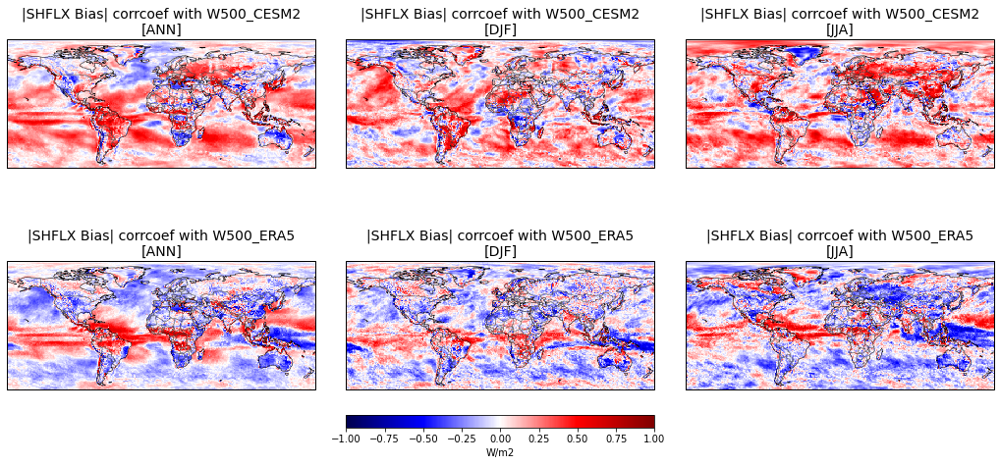

In [43]:
# Set up figure 
# -------------
fig, axs = plt.subplots(2,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree()})
#Put axs handles in array, axs 
axs = axs.ravel()
#Adjust space between subplots 
fig.subplots_adjust(hspace = -0.7,wspace = 0.1)
# Set limits of plot
axs[0].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[1].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[2].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[3].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[4].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[5].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
# Add coastlines 
axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
# Add country borders 
axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# Now plot some correlations... 
# ---------------------

cmax = 1.0
cmin = -cmax

contour_plot0 = axs[0].pcolor(lon,lat,SH_v_cesmW500_corrAnn,
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot1 = axs[1].pcolor(lon,lat,SH_v_cesmW500_corrDJF,
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot2 = axs[2].pcolor(lon,lat,SH_v_cesmW500_corrJJA,
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

axs[0].set_title('|SHFLX Bias| corrcoef with W500_CESM2\n[ANN]',fontsize=14)
axs[1].set_title('|SHFLX Bias| corrcoef with W500_CESM2\n[DJF]',fontsize=14)
axs[2].set_title('|SHFLX Bias| corrcoef with W500_CESM2\n[JJA]',fontsize=14)


# Plot the same for ERA5
# -----------------------
contour_plot3 = axs[3].pcolor(lon,lat,SH_v_era5W500_corrAnn,
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot4 = axs[4].pcolor(lon,lat,SH_v_era5W500_corrDJF,
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot5 = axs[5].pcolor(lon,lat,SH_v_era5W500_corrJJA,
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')                  

ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot4, orientation='horizontal', cax=cbar_ax, label='W/m2')


axs[3].set_title('|SHFLX Bias| corrcoef with W500_ERA5\n[ANN]',fontsize=14)
axs[4].set_title('|SHFLX Bias| corrcoef with W500_ERA5\n[DJF]',fontsize=14)
axs[5].set_title('|SHFLX Bias| corrcoef with W500_ERA5\n[JJA]',fontsize=14)



Text(0.5, 1.0, '|LHFLX Bias| corrcoef with W500_ERA5\n[JJA]')

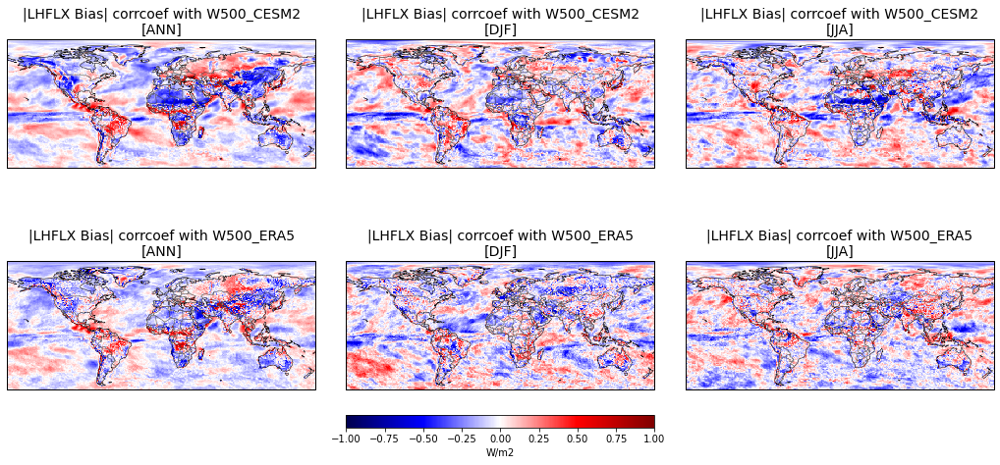

In [44]:
# Set up figure 
# -------------
fig, axs = plt.subplots(2,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree()})
#Put axs handles in array, axs 
axs = axs.ravel()
#Adjust space between subplots 
fig.subplots_adjust(hspace = -0.7,wspace = 0.1)
# Set limits of plot
axs[0].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[1].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[2].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[3].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[4].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
axs[5].set_extent([-180, 180, -60, 90], crs=ccrs.PlateCarree())
# Add coastlines 
axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
# Add country borders 
axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# Now plot some correlations... 
# ---------------------

cmax = 1.0
cmin = -cmax

contour_plot0 = axs[0].pcolor(lon,lat,LH_v_cesmW500_corrAnn,
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot1 = axs[1].pcolor(lon,lat,LH_v_cesmW500_corrDJF,
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot2 = axs[2].pcolor(lon,lat,LH_v_cesmW500_corrJJA,
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

axs[0].set_title('|LHFLX Bias| corrcoef with W500_CESM2\n[ANN]',fontsize=14)
axs[1].set_title('|LHFLX Bias| corrcoef with W500_CESM2\n[DJF]',fontsize=14)
axs[2].set_title('|LHFLX Bias| corrcoef with W500_CESM2\n[JJA]',fontsize=14)


# Plot the same for ERA5
# -----------------------
contour_plot3 = axs[3].pcolor(lon,lat,LH_v_era5W500_corrAnn,
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot4 = axs[4].pcolor(lon,lat,LH_v_era5W500_corrDJF,
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')

contour_plot5 = axs[5].pcolor(lon,lat,LH_v_era5W500_corrJJA,
                              cmap='seismic',vmax=cmax,vmin=cmin,shading='auto')                  

ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot4, orientation='horizontal', cax=cbar_ax, label='W/m2')


axs[3].set_title('|LHFLX Bias| corrcoef with W500_ERA5\n[ANN]',fontsize=14)
axs[4].set_title('|LHFLX Bias| corrcoef with W500_ERA5\n[DJF]',fontsize=14)
axs[5].set_title('|LHFLX Bias| corrcoef with W500_ERA5\n[JJA]',fontsize=14)




## Looking at maps

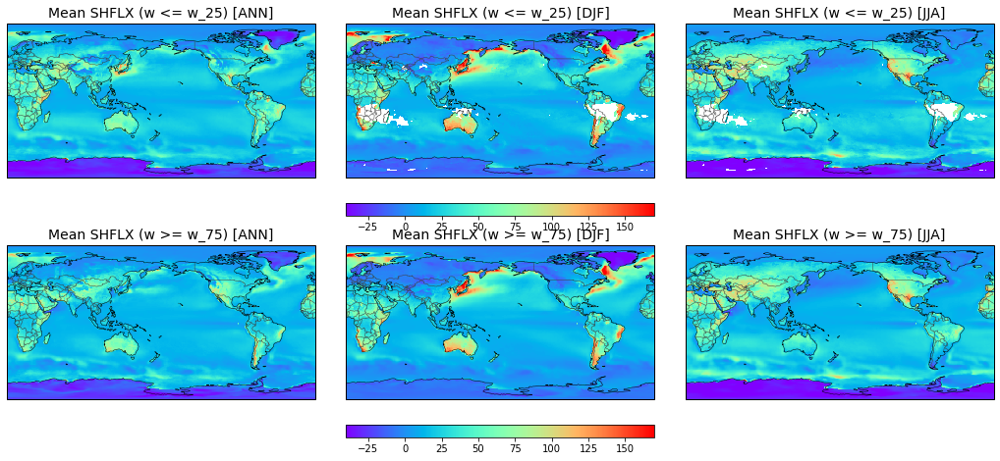

In [21]:
# --------------------------------------------------
# Plot: Surface fluxes for values of W (local pct)
# --------------------------------------------------

# Set up figure 
# -------------
fig, axs = plt.subplots(2,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
#Put axs handles in array, axs 
axs = axs.ravel()
#Adjust space between subplots 
fig.subplots_adjust(hspace = -0.7,wspace = 0.1)
# Set limits of plot
# axs[0].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# axs[1].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# axs[2].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# axs[3].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# axs[4].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# axs[5].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# Add coastlines 
axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
# Add country borders 
axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# Now plot some means... 
# ---------------------

contour_plot0 = axs[0].pcolor(lon,lat,meanDS['SHFLX_25w_annual'].values,shading='auto',
                              vmax=170,vmin=-40,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot1 = axs[1].pcolor(lon,lat,meanDS['SHFLX_25w_DJF'].values,shading='auto',
                              vmax=170,vmin=-40,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot2 = axs[2].pcolor(lon,lat,meanDS['SHFLX_25w_JJA'].values,shading='auto',
                              vmax=170,vmin=-40,cmap='rainbow',transform=ccrs.PlateCarree())

contour_plot3 = axs[3].pcolor(lon,lat,meanDS['SHFLX_75w_annual'].values,shading='auto',
                              vmax=170,vmin=-40,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot4 = axs[4].pcolor(lon,lat,meanDS['SHFLX_75w_DJF'].values,shading='auto',
                              vmax=170,vmin=-40,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot5 = axs[5].pcolor(lon,lat,meanDS['SHFLX_75w_JJA'].values,shading='auto',
                              vmax=170,vmin=-40,cmap='rainbow',transform=ccrs.PlateCarree())


axs[0].set_title('Mean SHFLX (w <= w_25) [ANN]',fontsize=14)
axs[1].set_title('Mean SHFLX (w <= w_25) [DJF]',fontsize=14)
axs[2].set_title('Mean SHFLX (w <= w_25) [JJA]',fontsize=14)

axs[3].set_title('Mean SHFLX (w >= w_75) [ANN]',fontsize=14)
axs[4].set_title('Mean SHFLX (w >= w_75) [DJF]',fontsize=14)
axs[5].set_title('Mean SHFLX (w >= w_75) [JJA]',fontsize=14)

ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)

ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)



In [23]:
np.nanmin(meanDS['SHFLX_75w_annual'].values-meanDS['SHFLX_25w_annual'].values)

-131.6180911064148

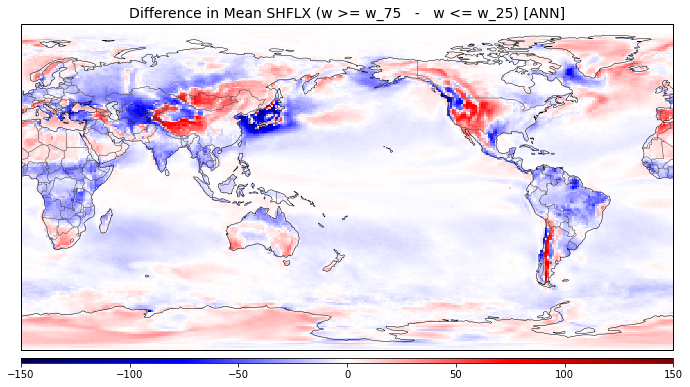

In [27]:
# --------------------------------------------------
# Plot: Surface fluxes for values of W (local pct)
# --------------------------------------------------

# Set up figure 
# -------------
fig, ax1 = plt.subplots(1,1, figsize=(12, 6), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
# Add coastlines 
ax1.coastlines(linewidth=0.5,edgecolor='0.25')
ax1.add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# Now plot some means... 
# ---------------------

contour_plot0 = ax1.pcolor(lon,lat,(meanDS['SHFLX_75w_annual'].values-meanDS['SHFLX_25w_annual'].values),
                           shading='auto',
                           vmax=150,vmin=-150,
                           cmap='seismic',transform=ccrs.PlateCarree())

ax1.set_title('Difference in Mean SHFLX (w >= w_75   -   w <= w_25) [ANN]',fontsize=14)

ax_position = ax1.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot0, orientation='horizontal', cax=cbar_ax)



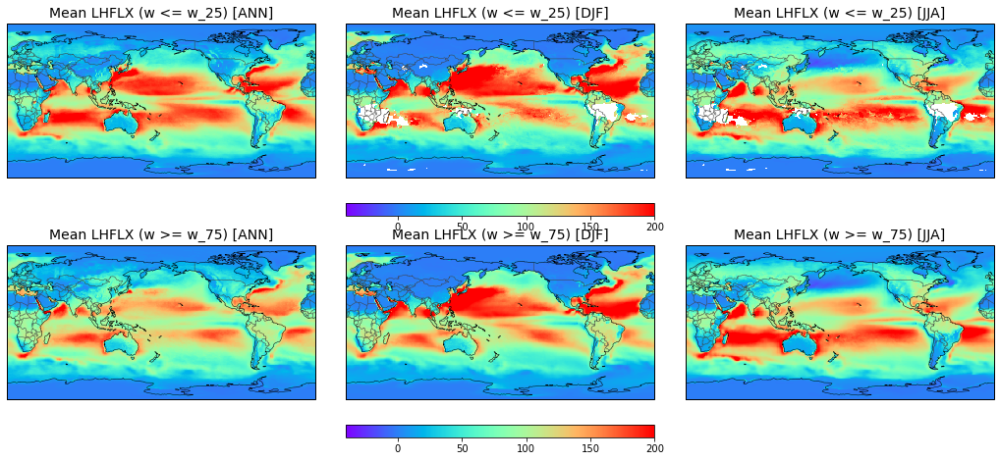

In [28]:
# --------------------------------------------------
# Plot: Surface fluxes for values of W (local pct)
# --------------------------------------------------

# Set up figure 
# -------------
fig, axs = plt.subplots(2,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180.0)})
#Put axs handles in array, axs 
axs = axs.ravel()
#Adjust space between subplots 
fig.subplots_adjust(hspace = -0.7,wspace = 0.1)
# # Set limits of plot
# axs[0].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# axs[1].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# axs[2].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# axs[3].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# axs[4].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# axs[5].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# Add coastlines 
axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
# Add country borders 
axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# Now plot some means... 
# ---------------------

contour_plot0 = axs[0].pcolor(lon,lat,meanDS['LHFLX_25w_annual'].values,shading='auto',
                              vmax=200,vmin=-40,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot1 = axs[1].pcolor(lon,lat,meanDS['LHFLX_25w_DJF'].values,shading='auto',
                              vmax=200,vmin=-40,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot2 = axs[2].pcolor(lon,lat,meanDS['LHFLX_25w_JJA'].values,shading='auto',
                              vmax=200,vmin=-40,cmap='rainbow',transform=ccrs.PlateCarree())

contour_plot3 = axs[3].pcolor(lon,lat,meanDS['LHFLX_75w_annual'].values,shading='auto',
                              vmax=200,vmin=-40,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot4 = axs[4].pcolor(lon,lat,meanDS['LHFLX_75w_DJF'].values,shading='auto',
                              vmax=200,vmin=-40,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot5 = axs[5].pcolor(lon,lat,meanDS['LHFLX_75w_JJA'].values,shading='auto',
                              vmax=200,vmin=-40,cmap='rainbow',transform=ccrs.PlateCarree())


axs[0].set_title('Mean LHFLX (w <= w_25) [ANN]',fontsize=14)
axs[1].set_title('Mean LHFLX (w <= w_25) [DJF]',fontsize=14)
axs[2].set_title('Mean LHFLX (w <= w_25) [JJA]',fontsize=14)

axs[3].set_title('Mean LHFLX (w >= w_75) [ANN]',fontsize=14)
axs[4].set_title('Mean LHFLX (w >= w_75) [DJF]',fontsize=14)
axs[5].set_title('Mean LHFLX (w >= w_75) [JJA]',fontsize=14)

ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)

ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)



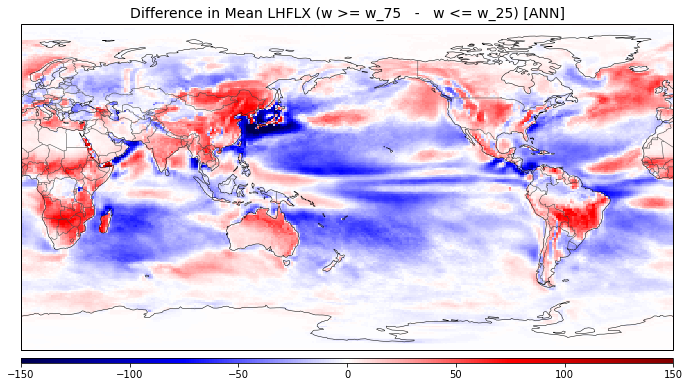

In [29]:
# --------------------------------------------------
# Plot: Surface fluxes for values of W (local pct)
# --------------------------------------------------

# Set up figure 
# -------------
fig, ax1 = plt.subplots(1,1, figsize=(12, 6), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
# Add coastlines 
ax1.coastlines(linewidth=0.5,edgecolor='0.25')
ax1.add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# Now plot some means... 
# ---------------------

contour_plot0 = ax1.pcolor(lon,lat,(meanDS['LHFLX_75w_annual'].values-meanDS['LHFLX_25w_annual'].values),
                           shading='auto',
                           vmax=150,vmin=-150,
                           cmap='seismic',transform=ccrs.PlateCarree())

ax1.set_title('Difference in Mean LHFLX (w >= w_75   -   w <= w_25) [ANN]',fontsize=14)

ax_position = ax1.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot0, orientation='horizontal', cax=cbar_ax)




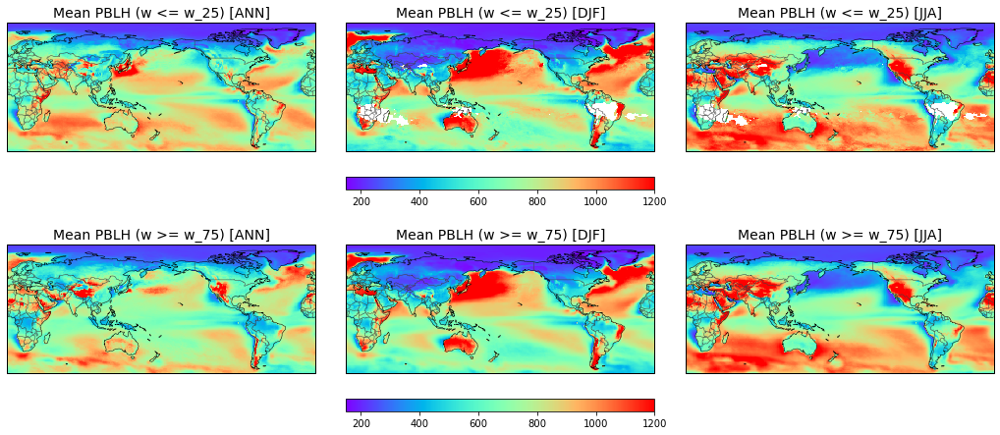

In [30]:
# --------------------------------------------------
# Plot: Mean PBLH for values of W (local pct)
# --------------------------------------------------

# Set up figure 
# -------------
fig, axs = plt.subplots(2,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180.0)})
#Put axs handles in array, axs 
axs = axs.ravel()
#Adjust space between subplots 
fig.subplots_adjust(hspace = -0.7,wspace = 0.1)
# Set limits of plot
axs[0].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[1].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[2].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[3].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[4].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[5].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# Add coastlines 
axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
# Add country borders 
axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# Now plot some means... 
# ---------------------

contour_plot0 = axs[0].pcolor(lon,lat,meanDS['PBLH_25w_annual'].values,shading='auto',
                              vmax=1200,vmin=150,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot1 = axs[1].pcolor(lon,lat,meanDS['PBLH_25w_DJF'].values,shading='auto',
                              vmax=1200,vmin=150,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot2 = axs[2].pcolor(lon,lat,meanDS['PBLH_25w_JJA'].values,shading='auto',
                              vmax=1200,vmin=150,cmap='rainbow',transform=ccrs.PlateCarree())

contour_plot3 = axs[3].pcolor(lon,lat,meanDS['PBLH_75w_annual'].values,shading='auto',
                              vmax=1200,vmin=150,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot4 = axs[4].pcolor(lon,lat,meanDS['PBLH_75w_DJF'].values,shading='auto',
                              vmax=1200,vmin=150,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot5 = axs[5].pcolor(lon,lat,meanDS['PBLH_75w_JJA'].values,shading='auto',
                              vmax=1200,vmin=150,cmap='rainbow',transform=ccrs.PlateCarree())


axs[0].set_title('Mean PBLH (w <= w_25) [ANN]',fontsize=14)
axs[1].set_title('Mean PBLH (w <= w_25) [DJF]',fontsize=14)
axs[2].set_title('Mean PBLH (w <= w_25) [JJA]',fontsize=14)

axs[3].set_title('Mean PBLH (w >= w_75) [ANN]',fontsize=14)
axs[4].set_title('Mean PBLH (w >= w_75) [DJF]',fontsize=14)
axs[5].set_title('Mean PBLH (w >= w_75) [JJA]',fontsize=14)

ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)

ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)



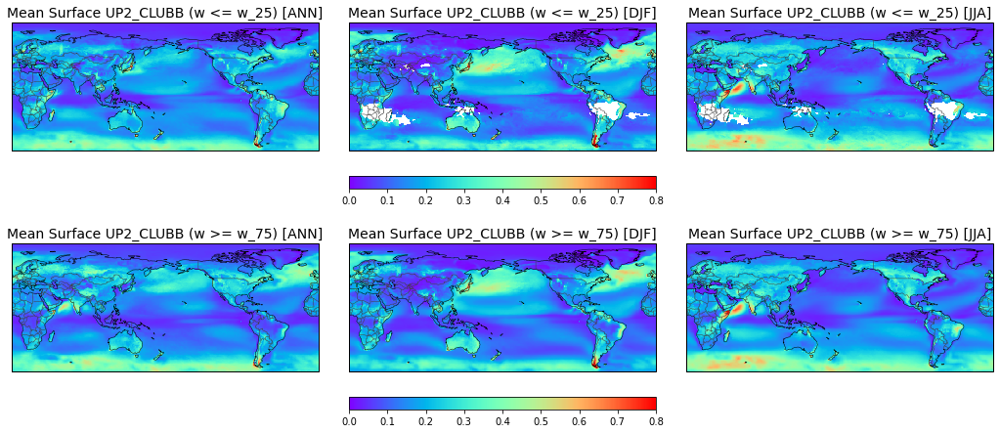

In [31]:
# --------------------------------------------------
# Plot: Mean UP2 for values of W (local pct)
# --------------------------------------------------

# Set up figure 
# -------------
fig, axs = plt.subplots(2,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180.0)})
#Put axs handles in array, axs 
axs = axs.ravel()
#Adjust space between subplots 
fig.subplots_adjust(hspace = -0.7,wspace = 0.1)
# Set limits of plot
axs[0].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[1].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[2].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[3].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[4].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[5].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# Add coastlines 
axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
# Add country borders 
axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# Now plot some means... 
# ---------------------

contour_plot0 = axs[0].pcolor(lon,lat,meanDS['UP2_25w_annual'].values[-2,:,:],shading='auto',
                              vmax=0.8,vmin=0,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot1 = axs[1].pcolor(lon,lat,meanDS['UP2_25w_DJF'].values[-2,:,:],shading='auto',
                              vmax=0.8,vmin=0,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot2 = axs[2].pcolor(lon,lat,meanDS['UP2_25w_JJA'].values[-2,:,:],shading='auto',
                              vmax=0.8,vmin=0,cmap='rainbow',transform=ccrs.PlateCarree())

contour_plot3 = axs[3].pcolor(lon,lat,meanDS['UP2_75w_annual'].values[-2,:,:],shading='auto',
                              vmax=0.8,vmin=0,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot4 = axs[4].pcolor(lon,lat,meanDS['UP2_75w_DJF'].values[-2,:,:],shading='auto',
                              vmax=0.8,vmin=0,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot5 = axs[5].pcolor(lon,lat,meanDS['UP2_75w_JJA'].values[-2,:,:],shading='auto',
                              vmax=0.8,vmin=0,cmap='rainbow',transform=ccrs.PlateCarree())


axs[0].set_title('Mean Surface UP2_CLUBB (w <= w_25) [ANN]',fontsize=14)
axs[1].set_title('Mean Surface UP2_CLUBB (w <= w_25) [DJF]',fontsize=14)
axs[2].set_title('Mean Surface UP2_CLUBB (w <= w_25) [JJA]',fontsize=14)

axs[3].set_title('Mean Surface UP2_CLUBB (w >= w_75) [ANN]',fontsize=14)
axs[4].set_title('Mean Surface UP2_CLUBB (w >= w_75) [DJF]',fontsize=14)
axs[5].set_title('Mean Surface UP2_CLUBB (w >= w_75) [JJA]',fontsize=14)

ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)

ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)


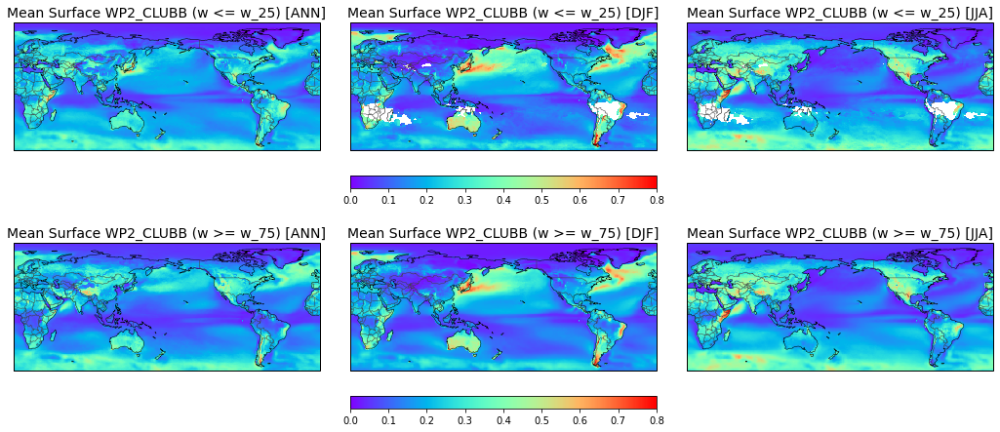

In [32]:
# --------------------------------------------------
# Plot: Mean WP2 for values of W (local pct)
# --------------------------------------------------

# Set up figure 
# -------------
fig, axs = plt.subplots(2,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180.0)})
#Put axs handles in array, axs 
axs = axs.ravel()
#Adjust space between subplots 
fig.subplots_adjust(hspace = -0.7,wspace = 0.1)
# Set limits of plot
axs[0].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[1].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[2].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[3].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[4].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[5].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# Add coastlines 
axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
# Add country borders 
axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# Now plot some means... 
# ---------------------

contour_plot0 = axs[0].pcolor(lon,lat,meanDS['WP2_25w_annual'].values[-2,:,:],shading='auto',
                              vmax=0.8,vmin=0,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot1 = axs[1].pcolor(lon,lat,meanDS['WP2_25w_DJF'].values[-2,:,:],shading='auto',
                              vmax=0.8,vmin=0,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot2 = axs[2].pcolor(lon,lat,meanDS['WP2_25w_JJA'].values[-2,:,:],shading='auto',
                              vmax=0.8,vmin=0,cmap='rainbow',transform=ccrs.PlateCarree())

contour_plot3 = axs[3].pcolor(lon,lat,meanDS['WP2_75w_annual'].values[-2,:,:],shading='auto',
                              vmax=0.8,vmin=0,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot4 = axs[4].pcolor(lon,lat,meanDS['WP2_75w_DJF'].values[-2,:,:],shading='auto',
                              vmax=0.8,vmin=0,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot5 = axs[5].pcolor(lon,lat,meanDS['WP2_75w_JJA'].values[-2,:,:],shading='auto',
                              vmax=0.8,vmin=0,cmap='rainbow',transform=ccrs.PlateCarree())


axs[0].set_title('Mean Surface WP2_CLUBB (w <= w_25) [ANN]',fontsize=14)
axs[1].set_title('Mean Surface WP2_CLUBB (w <= w_25) [DJF]',fontsize=14)
axs[2].set_title('Mean Surface WP2_CLUBB (w <= w_25) [JJA]',fontsize=14)

axs[3].set_title('Mean Surface WP2_CLUBB (w >= w_75) [ANN]',fontsize=14)
axs[4].set_title('Mean Surface WP2_CLUBB (w >= w_75) [DJF]',fontsize=14)
axs[5].set_title('Mean Surface WP2_CLUBB (w >= w_75) [JJA]',fontsize=14)

ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)

ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)



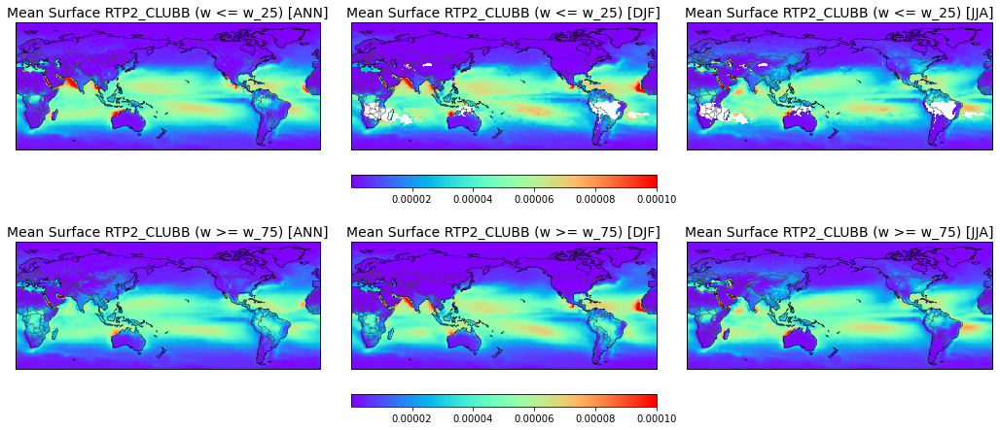

In [33]:
# --------------------------------------------------
# Plot: Mean RTP2 for values of W (local pct)
# --------------------------------------------------

# Set up figure 
# -------------
fig, axs = plt.subplots(2,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180.0)})
#Put axs handles in array, axs 
axs = axs.ravel()
#Adjust space between subplots 
fig.subplots_adjust(hspace = -0.7,wspace = 0.1)
# Set limits of plot
axs[0].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[1].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[2].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[3].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[4].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[5].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# Add coastlines 
axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
# Add country borders 
axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# Now plot some means... 
# ---------------------

contour_plot0 = axs[0].pcolor(lon,lat,meanDS['RTP2_25w_annual'].values[-2,:,:],shading='auto',
                              vmax=1.0e-4,vmin=0.01e-6,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot1 = axs[1].pcolor(lon,lat,meanDS['RTP2_25w_DJF'].values[-2,:,:],shading='auto',
                              vmax=1.0e-4,vmin=0.01e-6,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot2 = axs[2].pcolor(lon,lat,meanDS['RTP2_25w_JJA'].values[-2,:,:],shading='auto',
                              vmax=1.0e-4,vmin=0.01e-6,cmap='rainbow',transform=ccrs.PlateCarree())

contour_plot3 = axs[3].pcolor(lon,lat,meanDS['RTP2_75w_annual'].values[-2,:,:],shading='auto',
                              vmax=1.0e-4,vmin=0.01e-6,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot4 = axs[4].pcolor(lon,lat,meanDS['RTP2_75w_DJF'].values[-2,:,:],shading='auto',
                              vmax=1.0e-4,vmin=0.01e-6,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot5 = axs[5].pcolor(lon,lat,meanDS['RTP2_75w_JJA'].values[-2,:,:],shading='auto',
                              vmax=1.0e-4,vmin=0.01e-6,cmap='rainbow',transform=ccrs.PlateCarree())

axs[0].set_title('Mean Surface RTP2_CLUBB (w <= w_25) [ANN]',fontsize=14)
axs[1].set_title('Mean Surface RTP2_CLUBB (w <= w_25) [DJF]',fontsize=14)
axs[2].set_title('Mean Surface RTP2_CLUBB (w <= w_25) [JJA]',fontsize=14)

axs[3].set_title('Mean Surface RTP2_CLUBB (w >= w_75) [ANN]',fontsize=14)
axs[4].set_title('Mean Surface RTP2_CLUBB (w >= w_75) [DJF]',fontsize=14)
axs[5].set_title('Mean Surface RTP2_CLUBB (w >= w_75) [JJA]',fontsize=14)

ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)

ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)



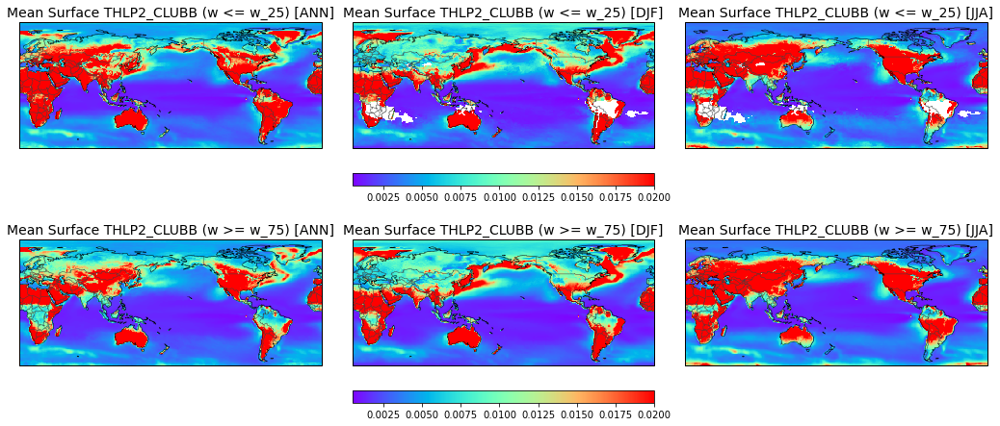

In [34]:
# --------------------------------------------------
# Plot: Mean THLP2 for values of W (local pct)
# --------------------------------------------------

# Set up figure 
# -------------
fig, axs = plt.subplots(2,3, figsize=(18, 18), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180.0)})
#Put axs handles in array, axs 
axs = axs.ravel()
#Adjust space between subplots 
fig.subplots_adjust(hspace = -0.7,wspace = 0.1)
# Set limits of plot
axs[0].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[1].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[2].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[3].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[4].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
axs[5].set_extent([0, -180, -60, 90], crs=ccrs.PlateCarree())
# Add coastlines 
axs[0].coastlines(linewidth=0.5,edgecolor='0.25')
axs[1].coastlines(linewidth=0.5,edgecolor='0.25')
axs[2].coastlines(linewidth=0.5,edgecolor='0.25')
axs[3].coastlines(linewidth=0.5,edgecolor='0.25')
axs[4].coastlines(linewidth=0.5,edgecolor='0.25')
axs[5].coastlines(linewidth=0.5,edgecolor='0.25')
# Add country borders 
axs[0].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[1].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[2].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[3].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[4].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')
axs[5].add_feature(cfeature.BORDERS,linewidth=0.5,edgecolor='0.25')

# Now plot some means... 
# ---------------------

contour_plot0 = axs[0].pcolor(lon,lat,meanDS['THLP2_25w_annual'].values[-2,:,:],shading='auto',
                              vmax=0.02,vmin=5e-4,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot1 = axs[1].pcolor(lon,lat,meanDS['THLP2_25w_DJF'].values[-2,:,:],shading='auto',
                              vmax=0.02,vmin=5e-4,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot2 = axs[2].pcolor(lon,lat,meanDS['THLP2_25w_JJA'].values[-2,:,:],shading='auto',
                              vmax=0.02,vmin=5e-4,cmap='rainbow',transform=ccrs.PlateCarree())

contour_plot3 = axs[3].pcolor(lon,lat,meanDS['THLP2_75w_annual'].values[-2,:,:],shading='auto',
                              vmax=0.02,vmin=5e-4,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot4 = axs[4].pcolor(lon,lat,meanDS['THLP2_75w_DJF'].values[-2,:,:],shading='auto',
                              vmax=0.02,vmin=5e-4,cmap='rainbow',transform=ccrs.PlateCarree())
contour_plot5 = axs[5].pcolor(lon,lat,meanDS['THLP2_75w_JJA'].values[-2,:,:],shading='auto',
                              vmax=0.02,vmin=5e-4,cmap='rainbow',transform=ccrs.PlateCarree())

axs[0].set_title('Mean Surface THLP2_CLUBB (w <= w_25) [ANN]',fontsize=14)
axs[1].set_title('Mean Surface THLP2_CLUBB (w <= w_25) [DJF]',fontsize=14)
axs[2].set_title('Mean Surface THLP2_CLUBB (w <= w_25) [JJA]',fontsize=14)

axs[3].set_title('Mean Surface THLP2_CLUBB (w >= w_75) [ANN]',fontsize=14)
axs[4].set_title('Mean Surface THLP2_CLUBB (w >= w_75) [DJF]',fontsize=14)
axs[5].set_title('Mean Surface THLP2_CLUBB (w >= w_75) [JJA]',fontsize=14)

ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)

ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
cbar        = plt.colorbar(contour_plot1, orientation='horizontal', cax=cbar_ax)
